In [4]:
import numpy as np
import sys
#sys.path.append('/home/yungdankblast/Desktop/Research/delay-optimizer')
sys.path.append('/home/cayjobla/Desktop/Research/delay-optimizer')
from DelayEffects.Analyzer_new import FuncOpt
from matplotlib import pyplot as plt
import matplotlib.animation as animation
import matplotlib as mpl
from matplotlib.lines import Line2D
from Optimizer_Scripts.DelayTypeGenerators import *

# <center> Plots

In [2]:
# Initialize
dimensions = [2, 10, 100, 1000]
ack = {d:FuncOpt('Ackley', d) for d in dimensions}
rast = {d:FuncOpt('Rastrigin', d) for d in dimensions}
rosen = {d:FuncOpt('Rosenbrock', d) for d in dimensions}
zak = {d:FuncOpt('Zakharov', d) for d in dimensions}

### Helper Functions

In [3]:
def load_vals(func_dict, file_tags):
    if type(file_tags) == str:
        file_tags = {d:file_tags for d in dimensions}
    loss_name = func_dict[dimensions[0]].loss_name
    filenames = {d:f'Data/{loss_name}{d}d_{file_tags[d]}.npz' for d in dimensions}
    for d, func_obj in func_dict.items():
        func_obj.load(filenames[d])          # Load data into object
        
def unload(func_dict):
    for d, func_obj in func_dict.items():
        func_obj.reset()

# Bar Charts

In [4]:
def calc_mean(func_obj, delay_type, param_type='optimal', param_file='../final_params.csv'):
    func_obj.optimize(delay_type, break_opt=True, save_state=False, save_loss=True, 
                      save_grad=False, save_iters=False, param_type=param_type, 
                      param_file=param_file)
    print(func_obj.lr_params)
    return func_obj.get_mean_final(func_obj.loss_vals)

def compute_all(func_dict, delay_list, filename, param_type='optimal', param_file='../final_params.csv'):
    # Compute mean loss for each dimension and delay type
    means = {d:[] for d in dimensions}
    for d in dimensions:
        for delay_type in delay_list:
            means[d].append(calc_mean(func_dict[d], delay_type, param_type, param_file))
            func_dict[d].delete_data()

    np.save(filename, means, allow_pickle=True)    # Save values
    
    return means

def bar_chart(func_dict, delay_list, filename, param_type='optimal', param_file='../final_params.csv', **kwargs):
    # Load or compute mean values
    if os.path.exists(filename):
        means = np.load(filename, allow_pickle=True).item()
    else:
        means = compute_all(func_dict, delay_list, filename, param_type, param_file)
    
    # Initialize
    fig = plt.figure(figsize=(20, 4), dpi=300)
    axes = fig.subplots(1, 4).flatten()
    loss_name = func_dict[dimensions[0]].loss_name
    width = 0.35
    colors = ['C1', 'C0', 'C2', 'C3', 'C4']
    colors2 = ['lightblue', 'lightgreen', 'lightcoral', 'thistle']
    
    for i, d in enumerate(dimensions):
        axes[i].bar([width/2], [means[d][0]], width, color=[colors[0]], edgecolor='k')
        axes[i].bar(np.arange(1,5), means[d][1:5], width, color=colors[1:], edgecolor='k')
        axes[i].bar(np.arange(1,5) + width, means[d][5:], width, color=colors2, edgecolor='k')
        axes[i].set_title(loss_name + " " + str(d) + "d", fontsize=14)
        labels = ["Undelayed", "Uniform", "Decaying", "Stochastic", "Partial"]
        axes[i].set_xticks(np.arange(5) + width/2)
        axes[i].set_xticklabels(labels, rotation=30)
        
        if 'logscale' in kwargs and kwargs['logscale'] is True:
            axes[i].set_ylim([1e-8, max(means[d])*10])
            axes[i].set_yscale('log')
        if 'clip_axis' in kwargs and kwargs['clip_axis'] is True:
            undel_ratio = 2/3
            axes[i].set_ylim([0, means[d][0] / undel_ratio])
            
    fig.suptitle("Average Final Loss for Delayed and Undelayed Optimization", y=1.1, size=20)

In [10]:
L = 1
delay_list = [Undelayed(), Uniform(L, 2000), Decaying(L, 2000), Stochastic(L, 2000), Partial(L, 2000, p=0.5),
              Uniform(L, 1000), Decaying(L, 1000), Stochastic(L, 1000), Partial(L, 1000, p=0.5)]

## Ackley

In [1]:
filename = "ack_hist_optim_L1"
bar_chart(ack, delay_list, 'Data/'+filename+'.npy', param_type='optimal', param_file='test_params.csv')
plt.savefig('Plots/'+filename+'.png', bbox_inches="tight")
plt.show()

NameError: name 'bar_chart' is not defined

## Rastrigin

In [2]:
filename = "rast_hist_undel_L1"
bar_chart(rast, delay_list, 'Data/'+filename+'.npy', param_type='undelayed')
plt.savefig('Plots/'+filename+'.png', bbox_inches="tight")
plt.show()

NameError: name 'bar_chart' is not defined

## Rosenbrock

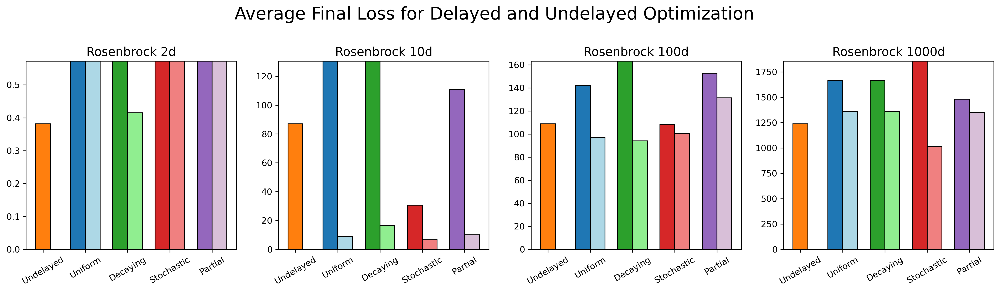

In [21]:
filename = "rosen_hist_optim_L1"
bar_chart(rosen, delay_list, 'Data/'+filename+'.npy', param_type='optimal', param_file='test_params.csv', 
          clip_axis=True)
plt.savefig('Plots/'+filename+'.png', bbox_inches="tight")
plt.show()

## Zakharov

In [3]:
filename = "zak_hist_undel_L1"
bar_chart(zak, delay_list, 'Data/'+filename+'.npy', param_type='undelayed')
plt.savefig('Plots/'+filename+'.png', bbox_inches="tight")
plt.show()

NameError: name 'bar_chart' is not defined

# Path Plots

In [19]:
def get_undel_path(func_obj, point, **kwargs):
    num_undel_iters = func_obj.del_iters[point] - analyzer.num_delays
    if num_undel_iters < 0:
        num_undel_iters = 0
    return {'plot_type':'paths', 'delayed':True, 'iters':-num_undel_iters, **kwargs}

def add_undel_path(analyzer, plots_list, point, **kwargs):
    new_plot_list = [plot.copy() for plot in plots_list]      # Create deep copy
    new_plot_list.append(get_undel_path(analyzer, point, points=[point], **kwargs))
    return new_plot_list


def path_plot(func_dict, delay_names, param_type='optimal', **kwargs):
    # Initialize
    num_points = len(func_dict[dimensions[0]].x_inits)
    num_delays = len(delay_names)
    loss_name = func_dict[dimensions[0]].loss_name
    domain = func_dict[dimensions[0]].domain
    fig, axes = plt.subplots(num_delays, 4, figsize=(15*num_delays, 15), dpi=300)
    
    # Plot
    for i, delay_name in enumerate(delay_names):
        load_path_vals(func_dict, delay_name, param_type)
        axes[i,0].set_ylabel(delay_name.capitalize(), fontsize=25)
        for j, d in enumerate(dimensions):
            func_obj = func_dict[d]
            for p in range(num_points):
                point_path = func_obj.states[p]
                axes[i,j].scatter(point_path[:,0], point_path[:,1], c=np.arange(func_obj.iters[p]+1),
                    norm=mpl.colors.Normalize(0, func_obj.maxiter+1), cmap='winter_r', alpha=1/255)
            # Format
            axes[i,j].set_title(f"{loss_name} {d}d", fontsize=25, pad=16) 
            
    for ax in np.ravel(axes):
        ax.set_xlim(domain)
        ax.set_ylim(domain)
        ax.tick_params(labelsize=16)
        
    fig.suptitle(f"Optimization Paths on the {loss_name} function", fontsize=40)
        
"""
def path_plot(plot_data, analyzer_dict, paths=False, point=None, iters=True, optimizer=None):
    # Initialize
    fig, axes = plt.subplots(2, 4, figsize=(30, 15), dpi=300)
    num_points = len(plot_data[dimensions[0]]['iters'])
    loss_name = analyzer_dict[dimensions[0]].loss_name
    range_grid = analyzer_dict[dimensions[0]].range_grid
    
    # Plot
    for i, d in enumerate(dimensions):
        # Paths (path line, starting point, ending point)
        if paths is True:
            path_data = plot_data[d]['time_series'][point].T
            del_path_data = plot_data[d]['del_time_series'][point].T
            axes[0,i].plot(path_data[0], path_data[1], c='gold', alpha=0.6, zorder=10, lw=4)
            axes[0,i].scatter(path_data[0][0], path_data[1][0], c='darkred', marker='^', s=250, zorder=11)
            axes[0,i].scatter(path_data[0][-1], path_data[1][-1], c='orange', marker='*', s=300, zorder=11)
            axes[1,i].plot(del_path_data[0], del_path_data[1], c='r', alpha=0.4, zorder=10, lw=4)
            axes[1,i].scatter(del_path_data[0][0], del_path_data[1][0], c='darkred', marker='^', s=250, zorder=11)
            axes[1,i].scatter(del_path_data[0][-1], del_path_data[1][-1], c='orange', marker='*', s=300, zorder=11)
        
        # Iters
        if iters is True:
            for p in range(num_points):
                iter_data = plot_data[d]['time_series'][p].T
                del_iter_data = plot_data[d]['del_time_series'][p].T
                axes[0,i].scatter(iter_data[0], iter_data[1], norm=mpl.colors.Normalize(0, 2000), 
                                  c=np.arange(plot_data[d]['iters'][p]), cmap='gist_rainbow', alpha=1/255)
                axes[1,i].scatter(del_iter_data[0], del_iter_data[1], norm=mpl.colors.Normalize(0, 2000), 
                                  c=np.arange(plot_data[d]['del_iters'][p]), cmap='gist_rainbow', alpha=1/255)
        
        # Optimizer
        if optimizer is not None:
            axes[0,i].scatter(optimizer[0], optimizer[1], c='k', marker='x', s=100, zorder=12)
            axes[1,i].scatter(optimizer[0], optimizer[1], c='k', marker='x', s=100, zorder=12)
                
        # Format
        axes[0,i].set_title(f"{loss_name} {d}d", fontsize=25, pad=16)
        
    for ax in np.ravel(axes):
        ax.set_xlim(range_grid)
        ax.set_ylim(range_grid)
        ax.tick_params(labelsize=16)
        
    axes[0,0].set_ylabel("Undelayed", fontsize=25)
    axes[1,0].set_ylabel("Delayed", fontsize=25)
    fig.suptitle(f"Optimization Paths on the {loss_name} function", fontsize=40)
"""

'\ndef path_plot(plot_data, analyzer_dict, paths=False, point=None, iters=True, optimizer=None):\n    # Initialize\n    fig, axes = plt.subplots(2, 4, figsize=(30, 15), dpi=300)\n    num_points = len(plot_data[dimensions[0]][\'iters\'])\n    loss_name = analyzer_dict[dimensions[0]].loss_name\n    range_grid = analyzer_dict[dimensions[0]].range_grid\n    \n    # Plot\n    for i, d in enumerate(dimensions):\n        # Paths (path line, starting point, ending point)\n        if paths is True:\n            path_data = plot_data[d][\'time_series\'][point].T\n            del_path_data = plot_data[d][\'del_time_series\'][point].T\n            axes[0,i].plot(path_data[0], path_data[1], c=\'gold\', alpha=0.6, zorder=10, lw=4)\n            axes[0,i].scatter(path_data[0][0], path_data[1][0], c=\'darkred\', marker=\'^\', s=250, zorder=11)\n            axes[0,i].scatter(path_data[0][-1], path_data[1][-1], c=\'orange\', marker=\'*\', s=300, zorder=11)\n            axes[1,i].plot(del_path_data[0], de

In [20]:
delay_list = [Undelayed(), Uniform(1, 1000)]
delay_names = [delay_type.name for delay_type in delay_list]
param_type = 'optimal'

## Ackley

In [20]:
# Compute and save plot values
gen_points(ack, num_points)
save_path_vals(ack, delay_list, param_type, param_file='test_params.csv', const_lr=True)

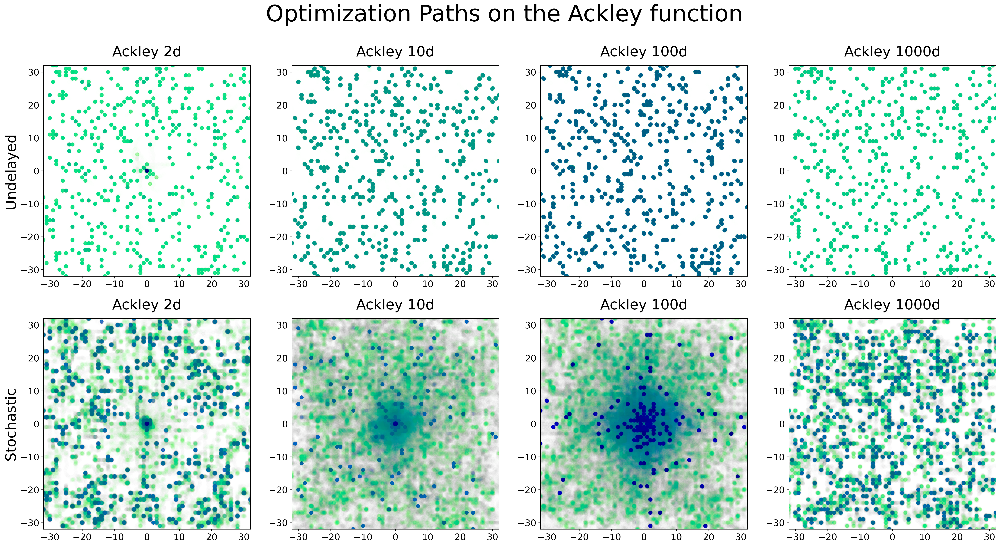

In [33]:
# Plot iterations
path_plot(ack, delay_names, param_type)
plt.savefig(f'Plots/{ack[dimensions[0]].loss_name}_path_{param_type}.png')
plt.show()

## Rastrigin

In [4]:
# Compute and save plot values
compute(rast, num_points)
save_plot_vals(rast)

NameError: name 'compute' is not defined

In [140]:
plot_data = load_plot_vals(rast)

In [5]:
#### Find a good point for the path
point = 34
path_plot(plot_data, point, 'Rastrigin', [-32.,32], iters=True, optimizer=[0,0], 
          filename="rast_path_plots_34.png")

NameError: name 'path_plot' is not defined

## Rosenbrock

In [58]:
# Compute and save plot values
compute(rosen, num_points)
save_plot_vals(rosen)

/home/cayjobla/anaconda3/lib/python3.8/site-packages/numpy/core/_asarray.py:171: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order, subok=True)


In [11]:
plot_data = load_plot_vals(rosen)

In [6]:
#### Find a good point for the path (23, 54, 57, 87, 89)
point = 87
path_plot(plot_data, point, 'Rosenbrock', [-10.,10], iters=True, optimizer=[1,1], 
          filename="rosen_path_plots_87.png")

NameError: name 'path_plot' is not defined

## Zakharov

In [7]:
# Compute and save plot values
compute(zak, num_points)
save_plot_vals(zak)

NameError: name 'compute' is not defined

In [21]:
plot_data = load_plot_vals(zak)